In [1]:
#Import base packages
import math
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pandas.tseries.offsets import DateOffset, MonthEnd
import scipy.linalg as la
from scipy.stats import norm
import time

#Set seeds for different algorithms
import random
random.seed(200)
np.random.seed(200)

#Setup directory and pickling
import os
import pickle

#Help ignore the high verbosity in optuna
import warnings
warnings.filterwarnings("ignore")

#Import sklearn metrics
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.covariance import LedoitWolf, OAS, GraphicalLassoCV, MinCovDet 

##### Documentation References

Graphical LASSO Cov

https://scikit-learn.org/stable/modules/generated/sklearn.covariance.GraphicalLassoCV.html

Robust Cov

https://scikit-learn.org/stable/auto_examples/covariance/plot_robust_vs_empirical_covariance.html#sphx-glr-auto-examples-covariance-plot-robust-vs-empirical-covariance-py

https://scikit-learn.org/stable/modules/generated/sklearn.covariance.MinCovDet.html#sklearn.covariance.MinCovDet




In [2]:
#Upload Stock & Bond data
#sb_df = pd.read_csv("C:/Users/andrew_lazzeri/Desktop/MultiAsset Covariance Matrix/Stock_Bond_Rets.csv")
sb_df = pd.read_csv("C:/Users/19712/Desktop/Asset Allocation Project/Liquid_Asset_Rets.csv")
sb_df['Date'] = pd.to_datetime(sb_df['Unnamed: 0'])
sb_df = sb_df.drop(['Unnamed: 0', 'MLPs', 'REITs', 'TIPS'], axis=1)
sb_df = sb_df.set_index(['Date'])
sb_synched_df = pd.DataFrame(sb_df.iloc[2::, :].astype(float)/100, columns = sb_df.columns)
sb_synched_df = sb_synched_df.dropna()

#Upload Commodity Data
#commodity_df = pd.read_csv("C:/Users/andrew_lazzeri/Desktop/MultiAsset Covariance Matrix/CommodityIndex.csv")
commodity_df = pd.read_csv("C:/Users/19712/Desktop/Asset Allocation Project/CommodityIndex.csv")
commodity_df['Date'] = pd.to_datetime(commodity_df['Date'].astype(str).str[0:8])
commodity_df = commodity_df.set_index('Date')

#Create a combined dataframe
combined_df = pd.DataFrame(index = sb_synched_df.index)
combined_df = combined_df.join(commodity_df)
combined_df = combined_df.pct_change(periods = 1)
combined_df = combined_df.join(sb_synched_df)

In [10]:
## Set Parameters ##
cov_window = 63 #Lookback window for the covariance matrix
days_fwd = 63 #Forward window for realized covariance matrix target
annualization_adj = 252 #Adjustment to annualize the covariance matrix (i.e. 252 for trading days)
initial_train_window = 2*252 #Required observations prior to first training
retrain_intervals = 252 #Amount of time between training intervals
CV_budget = 3 #Cross validations hyper parameter tuning for each algorithm

covar_matrix_output_dir = "C:/Users/19712/Desktop/Covariance Outputs/"

In [11]:
#Generating a series of covariance matrix
def create_tr_covar(combined_df, look_back, annualization_adj):
    covar_mat = combined_df.rolling(window = look_back).cov()
    covar_mat = covar_mat.dropna() * annualization_adj
    covar_mat.index.rename(['Date', 'Commodity'], inplace=True)
    return covar_mat

def create_exp_tr_covar(combined_df, look_back, annualization_adj):
    exp_covar_mat = combined_df.ewm(span=look_back).cov()
    exp_covar_mat = exp_covar_mat.dropna() * annualization_adj
    exp_covar_mat.index.rename(['Date', 'Commodity'], inplace=True)
    return exp_covar_mat

def Y_variable(covar_mat, fwd_period):
    y_covar_mat = covar_mat.copy()
    y_covar_mat = y_covar_mat.reset_index()
    y_covar_mat['Date'] = y_covar_mat['Date'] - DateOffset(days = fwd_period)
    y_covar_mat = y_covar_mat.set_index(['Date', 'Commodity'])
    return y_covar_mat

def backfill_covar(covar_df, resample_freq):
    covar_copy = covar_df.copy()
    min_date = min(covar_df.index.get_level_values('Date'))
    max_date = max(covar_df.index.get_level_values('Date'))
    dates = pd.date_range(min_date, max_date, freq = resample_freq)
    resampled_df = pd.DataFrame()
    
    for i in range(len(dates)):
        if (covar_df[covar_df.index.get_level_values('Date') == dates[i]].shape[0] != 0):
            iter_covar_df = covar_copy[covar_copy.index.get_level_values('Date') == dates[i]]
            resampled_df = pd.concat([resampled_df, iter_covar_df])
        elif (covar_df[covar_df.index.get_level_values('Date') == dates[i]].shape[0] == 0):
            last_time_stamp = max(resampled_df.index.get_level_values('Date'))
            iter_covar_df = resampled_df[resampled_df.index.get_level_values('Date') == last_time_stamp]
            iter_covar_df = iter_covar_df.reset_index()
            iter_covar_df['Date'] = pd.to_datetime(dates[i])
            iter_covar_df = iter_covar_df.set_index(['Date', 'Commodity'])
            resampled_df = pd.concat([resampled_df, iter_covar_df])
   
    return resampled_df

y_df = Y_variable(create_tr_covar(combined_df, cov_window, annualization_adj), days_fwd)
y_df = backfill_covar(y_df, 'D')
y_df.to_csv(covar_matrix_output_dir + 'Realized_Covariance.csv')

In [5]:
def cov_cross_validation(joined_df, ts_folds = CV_budget):
    dates = sorted(list(set(joined_df.index.get_level_values('Date'))))
    rough_splits = len(dates) // (ts_folds)
    errors = []
    idx = [dates[i] for i in range(0, len(dates), rough_splits)]
    for i in range(1, len(idx)):
        iter_df = joined_df[(joined_df.index.get_level_values('Date') > idx[i-1]) & (joined_df.index.get_level_values('Date') <= idx[i])]
        MSE_X = iter_df[[col for col in iter_df.columns if 'Y_' not in col]]
        MSE_y = iter_df[[col for col in iter_df.columns if 'Y_' in col]]
        MSE = mean_squared_error(MSE_X, MSE_y)
        errors.append(MSE)
    return np.mean(errors)

def exp_cov_training_inst(combined_df, cov_window, annualization_adj, days_fwd, CV_budget, eval_spans = [i for i in range(63, 253, 21)]):
    Y_df = Y_variable(create_tr_covar(combined_df, cov_window, annualization_adj), days_fwd)
    Y_df = backfill_covar(Y_df, 'D')
    Y_df = Y_df.add_prefix('Y_')
    span_perf = {}
    span_df = {}
    
    for span in eval_spans:
        X_df = create_exp_tr_covar(combined_df, span, annualization_adj)
        span_df[span] = X_df
        joined_df = X_df.join(Y_df)
        joined_df = joined_df.dropna()
        span_perf[span] = cov_cross_validation(joined_df, ts_folds = CV_budget)
    
    return span_perf, span_df 

def LW_Covar(return_df, X_df, span, annualization_adj):
    iter_df = return_df.dropna()
    dates  = sorted(list(set(X_df.index.get_level_values('Date'))))
    LW_df = pd.DataFrame()
    shrinkage = []
    
    for date in dates: 
        idx = X_df[X_df.index.get_level_values('Date') == date].index
        covar_iter = iter_df[iter_df.index.get_level_values('Date') <= date].iloc[-span::, :]
        cov = LedoitWolf().fit(covar_iter.values)
        covar_iter = pd.DataFrame(cov.covariance_, index = idx, columns = return_df.columns) * annualization_adj
        LW_df = pd.concat([LW_df, covar_iter])
        shrinkage.append(cov.shrinkage_)
        
    return LW_df, shrinkage

def OAS_Covar(return_df, X_df, span, annualization_adj):
    iter_df = return_df.dropna()
    dates  = sorted(list(set(X_df.index.get_level_values('Date'))))
    OAS_df = pd.DataFrame()
    shrinkage = []
    
    for date in dates: 
        idx = X_df[X_df.index.get_level_values('Date') == date].index
        covar_iter = iter_df[iter_df.index.get_level_values('Date') <= date].iloc[-span::, :]
        cov = OAS().fit(covar_iter.values)
        covar_iter = pd.DataFrame(cov.covariance_, index = idx, columns = return_df.columns) * annualization_adj
        OAS_df = pd.concat([OAS_df, covar_iter])
        shrinkage.append(cov.shrinkage_)
        
    return OAS_df, shrinkage

def LW_cov_training_inst(combined_df, cov_window, annualization_adj, days_fwd, CV_budget, eval_spans = [i for i in range(63, 253, 21)]):
    Y_df = Y_variable(create_tr_covar(combined_df, cov_window, annualization_adj), days_fwd)
    Y_df = backfill_covar(Y_df, 'D')
    Y_df = Y_df.add_prefix('Y_')
    span_perf = {}
    span_df = {}
    span_shrinkage = {}
    
    for span in eval_spans:
        X_df = create_exp_tr_covar(combined_df, span, annualization_adj)
        LW_df, shrinkage = LW_Covar(combined_df, X_df, span, annualization_adj)
        print(LW_df.shape)
        span_df[span] = LW_df
        span_shrinkage[span] = shrinkage
        joined_df = LW_df.join(Y_df)
        joined_df = joined_df.dropna()
        span_perf[span] = cov_cross_validation(joined_df, ts_folds = CV_budget)
        
    return span_perf, span_df, span_shrinkage

In [7]:
#span_df[63]

In [ ]:
def run_all_exp_cov(combined_df, span_annualization_adj):
    #Run the covariance dataframe up front once and store to save time
    cov_holder = {}
    for span in [i for i in range(30, 361, 30)]:
        cov_holder[span] = create_exp_tr_covar(combined_df, span, annualization_adj)
    return cov_holder

cov_holder = run_all_exp_cov(combined_df, annualization_adj)


In [9]:
def backtest_exp_cov(combined_df, initial_train_window, retrain_intervals, cov_window, annualization_adj, days_fwd, CV_budget, cov_holder):
    dates = sorted(set(list(combined_df.index)))
    prediction_df = pd.DataFrame(columns = combined_df.columns)
    best_span = 0
    optimized_spans = []
    
    #Cross validate exponential matrices
    for i in range(initial_train_window, len(dates)):
        
        if i % retrain_intervals == 0:
            iter_combined_df = combined_df[combined_df.index.get_level_values('Date')<=dates[i]]
            span_perf, span_df = exp_cov_training_inst(iter_combined_df, cov_window, annualization_adj, days_fwd, CV_budget)
            best_span = min(span_perf)
            optimized_spans.append(best_span)
            iter_df =  cov_holder[best_span]
            prediction_df = pd.concat([prediction_df, iter_df.loc[dates[i-1]:dates[i], :]])
        else:
            iter_df =  cov_holder[best_span]
            prediction_df = pd.concat([prediction_df, iter_df.loc[dates[i-1]:dates[i], :]])
    
    prediction_df.index = pd.MultiIndex.from_tuples(test_df.index, names=['Date', 'Commodity'])
    return prediction_df, optimized_spans

def backtest_LW_cov(combined_df, initial_train_window, retrain_intervals, cov_window, annualization_adj, days_fwd, CV_budget, cov_holder):
    dates = sorted(set(list(combined_df.index)))
    prediction_df = pd.DataFrame(columns = combined_df.columns)
    best_span = 0
    optimized_spans = []
        
    #Cross validate exponential matrices
    for i in range(initial_train_window, len(dates)):
        
        if i % retrain_intervals == 0:
            iter_combined_df = combined_df[combined_df.index.get_level_values('Date')<=dates[i]]
            span_perf, span_df, span_shrinkage = LW_cov_training_inst(iter_combined_df, cov_window, annualization_adj, days_fwd, CV_budget)
            best_span = min(span_perf)
            optimized_spans.append(best_span)
            iter_df =  cov_holder[best_span]
            prediction_df = pd.concat([prediction_df, iter_df.loc[dates[i-1]:dates[i], :]])
        else:
            iter_df =  cov_holder[best_span]
            prediction_df = pd.concat([prediction_df, iter_df.loc[dates[i-1]:dates[i], :]])
    
    prediction_df.index = pd.MultiIndex.from_tuples(test_df.index, names=['Date', 'Commodity'])
    return prediction_df


#prediction_df = backtest_exp_cov(combined_df, initial_train_window, retrain_intervals, cov_window, annualization_adj, days_fwd, CV_budget, cov_holder)   

In [10]:
#prediction_df = prediction_df.reset_index()
#prediction_df[['Date', 'Commodity']] = prediction_df['index'].str.split(',', expand = True)
#prediction_df = prediction_df.set_index('index')
#prediction_df.index = pd.MultiIndex.from_tuples(prediction_df.index.str.split('|').tolist())

In [115]:
test_df = span_df[63]

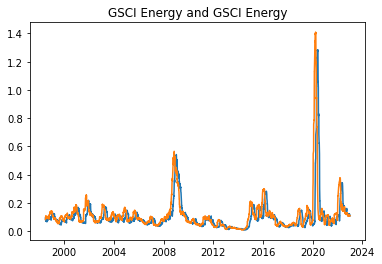

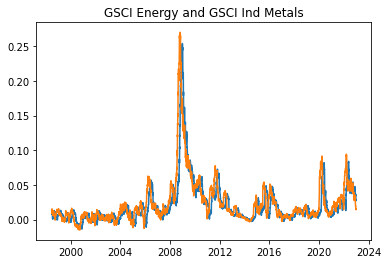

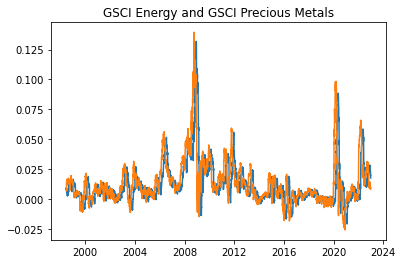

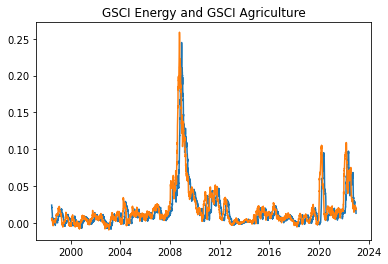

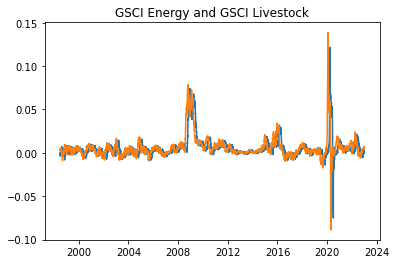

...

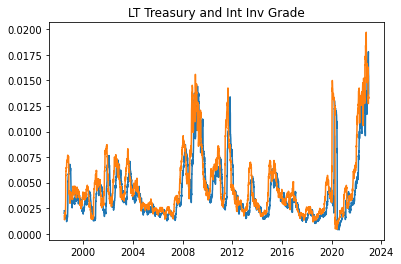

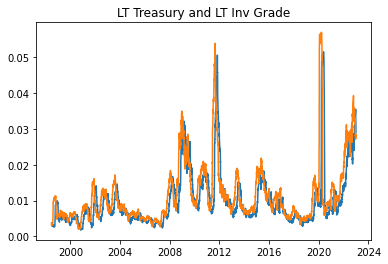

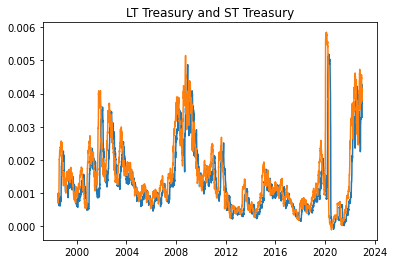

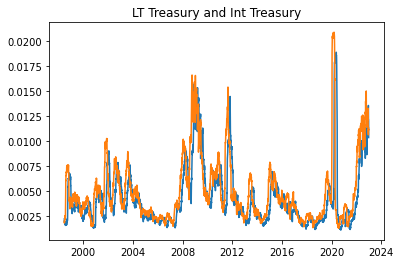

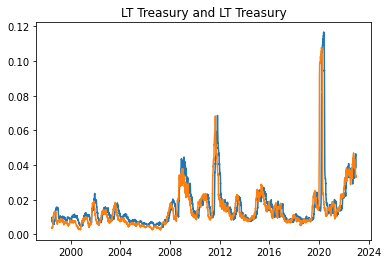

,LT Treasury,Y_LT Treasury
Date,,
1998-06-25,0.009779,0.003701
1998-06-26,0.009444,0.003455
1998-06-29,0.009281,0.003729
1998-06-30,0.008805,0.003795
1998-07-01,0.008569,0.003777
...,...,...
2022-12-21,0.044307,0.033738
2022-12-22,0.044122,0.033949
2022-12-23,0.043421,0.033985


In [116]:
def arrange_df(X_df, y_df):
    joined_df = X_df.join(y_df.add_prefix('Y_'))
    joined_df = joined_df.dropna()
    iter_cols = [col for col in joined_df.columns if 'Y_' not in col]
    joined_df = joined_df.reset_index()
    joined_df = joined_df.set_index('Date')
    
    for col1 in iter_cols:
        for col2 in iter_cols:
            iter_df = joined_df[joined_df['Commodity'] == col2][[col1, 'Y_'+ col1]]
            plt.title(col1 + " and " + col2)
            plt.plot(iter_df[col1].index, iter_df[col1])
            plt.plot(iter_df['Y_'+ col1].index, iter_df['Y_'+ col1])
            plt.show()
    
    return iter_df

arrange_df(test_df, y_df)

In [35]:
joined_df.head()

GSCI Energy  GSCI Precious Metals  \
Date       Commodity                                                 
2000-05-25 GSCI Energy              0.101353             -0.008023   
           GSCI Precious Metals    -0.008023              0.011325   
           Small Value              0.010674             -0.004460   
           Large Growth             0.020924             -0.004735   
           ST Treasury             -0.001344              0.000258   

                                 Small Value  Large Growth  ST Treasury  \
Date       Commodity                                                      
2000-05-25 GSCI Energy              0.010674      0.020924    -0.001344   
           GSCI Precious Metals    -0.004460     -0.004735     0.000258   
           Small Value              0.039778      0.047410    -0.000815   
           Large Growth             0.047410      0.109889    -0.000956   
           ST Treasury             -0.000815     -0.000956     0.000442   

                                 LT Inv Grade  Y_GSCI Energy  \
Date       Commodity                                           
2000-05-25 GSCI Energy              -0.004375       0.093073   
           GSCI Precious Metals     -0.001403       0.001043   
           Small Value               0.000075       0.001845   
           Large Growth             -0.001488       0.005522   
           ST Treasury               0.001247      -0.000427   

                                 Y_GSCI Precious Metals  Y_Small Value  \
Date       Commodity                                                     
2000-05-25 GSCI Energy                         0.001043       0.001845   
           GSCI Precious Metals                0.016183       0.004884   
           Small Value                         0.004884       0.026995   
           Large Growth                        0.004793       0.029681   
           ST Treasury                         0.000435       0.000909   

                                 Y_Large Growth  Y_ST Treasury  Y_LT Inv Grade  
Date       Commodity                                                            
2000-05-25 GSCI Energy                 0.005522      -0.000427       -0.001924  
           GSCI Precious Metals        0.004793       0.000435        0.000627  
           Small Value                 0.029681       0.000909        0.001862  
           Large Growth                0.065528       0.000798        0.001580  
           ST Treasury                 0.000798       0.000658        0.001551

In [12]:
#Generating a series of covariance matrix
def create_tr_covar(combined_df, look_back, annualization_adj):
    covar_mat = combined_df.rolling(window = look_back).cov()
    covar_mat = covar_mat.dropna() * annualization_adj
    covar_mat.index.rename(['Date', 'Commodity'], inplace=True)
    return covar_mat

def create_exp_tr_covar(combined_df, look_back, annualization_adj):
    exp_covar_mat = combined_df.ewm(span=look_back).cov()
    exp_covar_mat = exp_covar_mat.dropna() * annualization_adj
    exp_covar_mat.index.rename(['Date', 'Commodity'], inplace=True)
    return exp_covar_mat

def Y_variable(covar_mat, fwd_period):
    y_covar_mat = covar_mat.copy()
    y_covar_mat = y_covar_mat.reset_index()
    y_covar_mat['Date'] = y_covar_mat['Date'] - DateOffset(days = fwd_period)
    y_covar_mat = y_covar_mat.set_index(['Date', 'Commodity'])
    return y_covar_mat

def data_transform(original_mat):
    Lambda, Q = np.linalg.eig(original_mat)
    S = np.dot(Q,np.dot(np.diag(np.sqrt(Lambda)),Q.T))
    C = la.cholesky(S)
    return C

def to_rcov(transformed_mat):
    S = np.dot(transformed_mat.T, transformed_mat)
    Lambda, Q = np.linalg.eig(S)
    rcov = np.dot(Q,np.dot(np.diag(np.square(Lambda)),Q.T))
    return rcov

def generate_matrix(covar_mat):
    dates = sorted(list(set(covar_mat.index.get_level_values('Date'))))
    transformed_df = pd.DataFrame()
    for date in dates:
        iter_df = covar_mat[covar_mat.index.get_level_values('Date')==date]
        try:
            cholesky_mat = data_transform(iter_df)
            cholesky_df = pd.DataFrame(cholesky_mat, index = iter_df.index, columns = iter_df.columns)
            transformed_df = pd.concat([transformed_df, cholesky_df])
        except:
            continue
            
    return transformed_df 

def ML_feature_generator(cov_df:pd.DataFrame()) -> pd.DataFrame():
    melt_C_df = pd.melt(cov_df.reset_index(), id_vars = ['Date', 'Commodity'])
    melt_C_df = melt_C_df[melt_C_df['value']!=0]
    melt_C_df['FinalIdx'] = melt_C_df['Commodity'].str.split("_", expand = True)[0] + '_' + melt_C_df['variable'].str.split("_", expand = True)[0] 
    melt_C_df = melt_C_df[['Date','value', 'FinalIdx']]
    melt_C_df = melt_C_df.sort_values(['Date', 'FinalIdx'], ascending = True)
    melt_C_df = melt_C_df.set_index(['Date', 'FinalIdx'])
    return melt_C_df

def add_lags(cov_df, period_len, lags):
    iter_df = cov_df.copy()
    dates = sorted(list(set(iter_df.index.get_level_values('Date'))))
    lag_df = pd.DataFrame(index = dates)
    iter_pivot = iter_df.reset_index().pivot(index = 'Date', columns = 'FinalIdx', values = 'value')
    
    for i in range(0, lags*period_len+1, period_len):
        lag_add = iter_pivot.shift(i).copy()
        lag_add = lag_add.add_suffix('Lag_'+str(i))
        lag_df = lag_df.join(lag_add)
        
    return lag_df

def backfill_covar(covar_df, resample_freq):
    covar_copy = covar_df.copy()
    min_date = min(covar_df.index.get_level_values('Date'))
    max_date = max(covar_df.index.get_level_values('Date'))
    dates = pd.date_range(min_date, max_date, freq = resample_freq)
    resampled_df = pd.DataFrame()
    
    for i in range(len(dates)):
        if (covar_df[covar_df.index.get_level_values('Date') == dates[i]].shape[0] != 0):
            iter_covar_df = covar_copy[covar_copy.index.get_level_values('Date') == dates[i]]
            resampled_df = pd.concat([resampled_df, iter_covar_df])
        elif (covar_df[covar_df.index.get_level_values('Date') == dates[i]].shape[0] == 0):
            last_time_stamp = max(resampled_df.index.get_level_values('Date'))
            iter_covar_df = resampled_df[resampled_df.index.get_level_values('Date') == last_time_stamp]
            iter_covar_df = iter_covar_df.reset_index()
            iter_covar_df['Date'] = pd.to_datetime(dates[i])
            iter_covar_df = iter_covar_df.set_index(['Date', 'Commodity'])
            resampled_df = pd.concat([resampled_df, iter_covar_df])
   
    return resampled_df

X_df = generate_matrix(create_tr_covar(combined_df, cov_window, annualization_adj))
y_df = generate_matrix(Y_variable(create_tr_covar(combined_df, cov_window, annualization_adj), days_fwd))
y_df = backfill_covar(y_df, 'D')


In [8]:
X_df.tail(19)

GSCI Energy  GSCI Ind Metals  \
Date       Commodity                                            
2023-03-01 GSCI Energy              0.562947         0.044124   
           GSCI Ind Metals          0.000000         0.432097   
           GSCI Precious Metals     0.000000         0.000000   
           GSCI Agriculture         0.000000         0.000000   
           GSCI Livestock           0.000000         0.000000   
           Large Growth             0.000000         0.000000   
           Large Value              0.000000         0.000000   
           Small Growth             0.000000         0.000000   
           Small Value              0.000000         0.000000   
           Foreign Growth           0.000000         0.000000   
           Foreign Value            0.000000         0.000000   
           Emerging Markets         0.000000         0.000000   
           High Yield               0.000000         0.000000   
           ST Inv Grade             0.000000         0.000000   
           Int Inv Grade            0.000000         0.000000   
           LT Inv Grade             0.000000         0.000000   
           ST Treasury              0.000000         0.000000   
           Int Treasury             0.000000         0.000000   
           LT Treasury              0.000000         0.000000   

                                 GSCI Precious Metals  GSCI Agriculture  \
Date       Commodity                                                      
2023-03-01 GSCI Energy                       0.028779          0.066510   
           GSCI Ind Metals                   0.068282          0.038753   
           GSCI Precious Metals              0.368489         -0.009709   
           GSCI Agriculture                  0.000000          0.351928   
           GSCI Livestock                    0.000000          0.000000   
           Large Growth                      0.000000          0.000000   
           Large Value                       0.000000          0.000000   
           Small Growth                      0.000000          0.000000   
           Small Value                       0.000000          0.000000   
           Foreign Growth                    0.000000          0.000000   
           Foreign Value                     0.000000          0.000000   
           Emerging Markets                  0.000000          0.000000   
           High Yield                        0.000000          0.000000   
           ST Inv Grade                      0.000000          0.000000   
           Int Inv Grade                     0.000000          0.000000   
           LT Inv Grade                      0.000000          0.000000   
           ST Treasury                       0.000000          0.000000   
           Int Treasury                      0.000000          0.000000   
           LT Treasury                       0.000000          0.000000   

                                 GSCI Livestock  Large Growth  Large Value  \
Date       Commodity                                                         
2023-03-01 GSCI Energy                 0.017765      0.077579     0.049738   
           GSCI Ind Metals             0.031558      0.021160    -0.024794   
           GSCI Precious Metals       -0.009248      0.006430     0.030242   
           GSCI Agriculture            0.004190      0.007320     0.037218   
           GSCI Livestock              0.334713      0.033731     0.014552   
           Large Growth                0.000000      0.400077     0.105875   
           Large Value                 0.000000      0.000000     0.258941   
           Small Growth                0.000000      0.000000     0.000000   
           Small Value                 0.000000      0.000000     0.000000   
           Foreign Growth              0.000000      0.000000     0.000000   
           Foreign Value               0.000000      0.000000     0.000000   
           Emerging Markets            0.000000      0.000000     0.000000   